# System Identification - NARX

Silverbox refers to one of the nonlinear system identification benchmarks on http://nonlinearbenchmark.org/#Silverbox. 
It is a simulation of a [Duffing oscillator](https://en.wikipedia.org/wiki/Duffing_equation), ocurring for instance in nonlinear spring pendulums.

State-space model description of the system:

$$\begin{align}
m \frac{d^2 x(t)}{dt^2} + v \frac{d x(t)}{dt} + a x(t) + b x^3(t) =&\ u(t) + w(t) \\
y(t) =&\ x(t) + e(t)
\end{align}$$

where
$$\begin{align}
m     =&\ \text{mass} \\
v     =&\ \text{viscous damping} \\
a     =&\ \text{linear stiffness} \\
b     =&\ \text{nonlinear stiffness} \\
y(t)    =&\ \text{observation (displacement)} \\
x(t)    =&\ \text{state (displacement)} \\
u(t)    =&\ \text{force} \\
e(t)    =&\ \text{measurement noise} \\
w(t)    =&\ \text{process noise}
\end{align}$$

The process noise is a Wiener process, with the parameter $\tau$ representing the precision of the process. Measurement noise is also Wiener, with $\gamma$ as precision.

### Forecasting experiment

In this notebook, we will perform a forecasting experiment. The time-series will be split into a training and a validation part. In the training part, we will provide both input and output, and then infer parameters. In the forecasting part, we will only provide input. The parameters will be fixed to their inferred values and we will let the model make predictions for the output. Those predictions are evaluated against the true output.

### Data

Let's first have a look at the data.

In [1]:
using CSV
using DataFrames

In [2]:
using Plots
viz = true;

In [3]:
# Read data from CSV file
df = CSV.read("../data/SNLS80mV.csv", ignoreemptylines=true)
df = select(df, [:V1, :V2])

# Shorthand
input = df[:,1]
output = df[:,2]

# Time horizon
T = size(df, 1)

131072

In [4]:
# Select training set
trn = collect(40101:131072)
input_trn = input[trn]
output_trn = output[trn]
T_trn = length(trn);

# Select validation set
val = 101:40100
input_val = input[val]
output_val = output[val]
T_val = length(val);

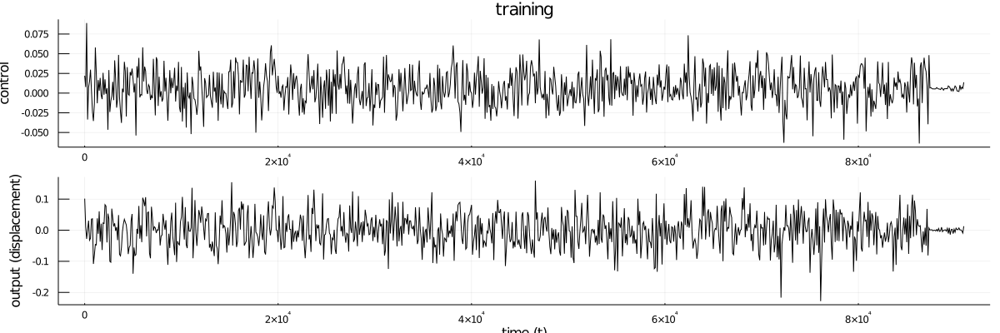

In [5]:
# Plot every n-th time-point to avoid figure size exploding
n = 100

if viz
    p1a = Plots.plot(1:n:T_trn, input_trn[1:n:end], color="black", label="", markersize=2, xlabel="", ylabel="control", size=(1200,400), title="training")    
    p1b = Plots.plot(1:n:T_trn, output_trn[1:n:end], color="black", label="", markersize=2, xlabel="time (t)", ylabel="output (displacement)", size=(1200,400))    
    p1 = plot(p1a, p1b, layout=(2,1))
#     Plots.savefig(p1, "viz/training_set.png")
end

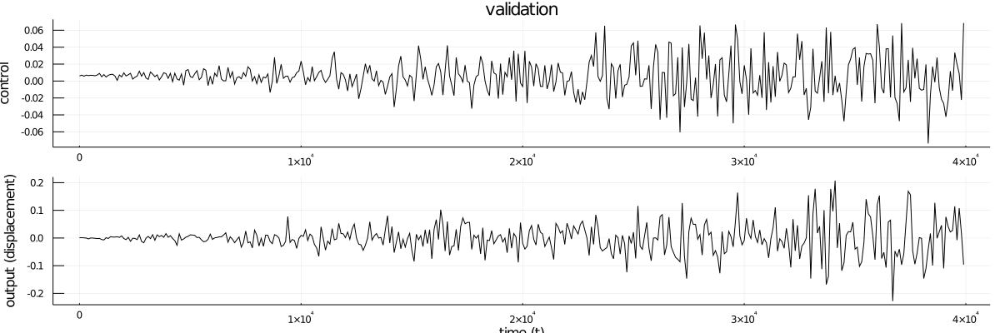

In [6]:
if viz
    p2a = Plots.plot(1:n:T_val, input_val[1:n:end], color="black", label="", markersize=2, xlabel="", ylabel="control", size=(1200,400), title="validation")    
    p2b = Plots.plot(1:n:T_val, output_val[1:n:end], color="black", label="", markersize=2, xlabel="time (t)", ylabel="output (displacement)", size=(1200,400))    
    p2 = plot(p2a, p2b, layout=(2,1))
#     Plots.savefig(p2, "viz/validation_set.png")
end

## Solution steps

In this notebook we are tackling the system with a black-box model, ignoring the physical parameters altogether.

### 1. NARX model

NARX stands for Nonlinear AutoRegressive model with eXogenous input. It sports the following output function:

$$\begin{align}
y_t =&\ f(\theta, x_{t-1}, u_t, z_{t-1})  + e_t
\end{align}$$

where $x_{t-1} = [y_{t-1}, \dots, y_{t-M}]^{\top}$ is the vector containing the history of $M$ previous observations and $z_{t-1} = [u_{t-1}, \dots, u_{t-N}]^{\top}$ is the history of $N$ previous inputs.

### 2. Convert to Gaussian probability

Integrating out $e_t$ produces a Gaussian state transition node:

$$y_t \sim \mathcal{N}(f(\theta, x_{t-1}, u_t, z_{t-1}), \gamma^{-1}) \, .$$

We can approximate the nonlinearity $f$ around $\theta$ through a Taylor series:

$$f(\theta, x_{t-1}, u_t, z_{t-1}) \approx f(m_\theta, x_{t-1}, u_t, z_{t-1}) + J_{\theta}^{\top}(\theta - m_{\theta})$$

where $J_{\theta} = \frac{d f}{d \theta} \big\vert_{\theta = m_{\theta}}$. The Jacobian can be obtained automatically using Julia packages such as [Zygote.jl](https://github.com/FluxML/Zygote.jl). 

The above is a likelihood node. The state transitions are deterministic and consist of just updating the history vectors $x_t = S_{M}x_{t-1} + s_{M}y_t$ and $z_t = S_{N}z_{t-1} + s_{N}u_t$, where:

$$ S_{M} = \begin{bmatrix} 0 \dots & 0 \\ I_{M-1} & 0 \end{bmatrix} \, , \quad s_{M} = \begin{bmatrix} 1 & 0_1 & \dots & 0_{M-1}\end{bmatrix}^{\top}$$

and likewise for $S_N$.

### 3. Choose priors

We currently have unknown parameters $\theta$ and $\gamma$. The coeffients can be both positive and negative, so we will opt for a Gaussian prior. The prior for a precision parameter $\gamma$ will be a Gamma distribution.

$$\begin{align}
p(\theta) =&\ \text{Normal}(\theta \mid m^{0}_{\theta}, V^{0}_{\theta}) \\
p(\gamma) =&\ \text{Gamma}(\gamma \mid a^{0}_\gamma, b^{0}_\gamma) 
\end{align}$$

Given the Taylor approximation, both priors are conjugate to the Gaussian likelihood node.

### 4. Recognition model

We choose the simplest possible recognition model, a mean-field factorisation of both unknown variables:

$$\begin{align}
q(\theta) =&\ \text{Normal}(\theta \mid m_{\theta}, V_{\theta}) \\
q(\gamma) =&\ \text{Gamma}(\gamma \mid a_\gamma, b_\gamma) 
\end{align}$$

Note that the generative and recognition model match, which means the recognition model's approximation error is potentially $0$.

## Implementation

We implement this model with the toolbox ForneyLab.jl and a custom NARX node.

In [7]:
using LinearAlgebra
using ForneyLab
using ForneyLab: unsafeMean, unsafeCov, unsafeVar, unsafePrecision
using ProgressMeter

In [8]:
include("../NARX-node/NARX.jl")
using .NARX

In [9]:
# Start graph
graph = FactorGraph()

# Autoregression orders
M = 3
N = 2

# Nonlinearity: cubic polynomial
f(θ, x, u, z) = θ'*[x.^3; x.^2; x.^1; u.^3; u.^2; u.^1; z.^3; z.^2; z.^1; 1]

# Number of parameters
num_coeffs = 3*(M+N+1)+1

# Static parameters
@RV θ ~ GaussianMeanPrecision(placeholder(:m_θ, dims=(num_coeffs,)), placeholder(:W_θ, dims=(num_coeffs, num_coeffs)))
@RV γ ~ Gamma(placeholder(:a_γ), placeholder(:b_γ))

# Setup observation and input vectors
@RV x_t
@RV z_t
@RV u_t

# NARX node
@RV y_t ~ NAutoregressiveX(θ, x_t, z_t, u_t, γ, g=f, id=:y_t)

# Mark placeholders for observation
placeholder(y_t, :y_t)
placeholder(x_t, :x_t, dims=(M,))
placeholder(z_t, :z_t, dims=(N,))
placeholder(u_t, :u_t)

# Draw time-slice subgraph
ForneyLab.draw(graph)

<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
 "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<!-- Generated by graphviz version 2.40.1 (20161225.0304)
 -->
<!-- Title: G Pages: 1 -->
 
 
 G 
 
<!-- 15427988087105734653 -->
 
 15427988087105734653 
 
 placeholder_W_θ 
 
<!-- 358269086217208291 -->
 
 358269086217208291 
 
 placeholder_b_γ 
 
<!-- 185125530775117027 -->
 
 185125530775117027 
 
 placeholder_m_θ 
 
<!-- 7193827197616951082 -->
 
 7193827197616951082 
 
 placeholder_z_t 
 
<!-- 9085642223438706694 -->
 
 9085642223438706694 
 
 NARX 
 y_t 
 
<!-- 7193827197616951082--9085642223438706694 -->
 
 7193827197616951082--9085642223438706694 
 
 z_t 
 4 z 
 1 out 
 
<!-- 11972318052515806896 -->
 
 11972318052515806896 
 
 𝒩 
 gaussianmeanprecision_1 
 
<!-- 9085642223438706694--11972318052515806896 -->
 
 9085642223438706694--11972318052515806896 
 
 θ 
 1 out 
 2 θ 
 
<!-- 11519543321370549660 -->
 
 11519543321370549660 
 
 Gam 
 gamma_1 
 
<!-- 9085642223438706694--11519543321370549660 -->
 
 9085642223438706694--11519543321370549660 
 
 γ 
 1 out 
 6 τ 
 
<!-- 11972318052515806896--15427988087105734653 -->
 
 11972318052515806896--15427988087105734653 
 
 W_θ 
 1 out 
 3 w 
 
<!-- 11972318052515806896--185125530775117027 -->
 
 11972318052515806896--185125530775117027 
 
 m_θ 
 1 out 
 2 m 
 
<!-- 528042913954522741 -->
 
 528042913954522741 
 
 placeholder_y_t 
 
<!-- 528042913954522741--9085642223438706694 -->
 
 528042913954522741--9085642223438706694 
 
 y_t 
 1 y 
 1 out 
 
<!-- 15991078814971917805 -->
 
 15991078814971917805 
 
 placeholder_u_t 
 
<!-- 15991078814971917805--9085642223438706694 -->
 
 15991078814971917805--9085642223438706694 
 
 u_t 
 5 u 
 1 out 
 
<!-- 11519543321370549660--358269086217208291 -->
 
 11519543321370549660--358269086217208291 
 
 b_γ 
 1 out 
 3 b 
 
<!-- 3928638518028820460 -->
 
 3928638518028820460 
 
 placeholder_a_γ 
 
<!-- 11519543321370549660--3928638518028820460 -->
 
 11519543321370549660--3928638518028820460 
 
 a_γ 
 1 out 
 2 a 
 
<!-- 5508074003693556800 -->
 
 5508074003693556800 
 
 placeholder_x_t 
 
<!-- 5508074003693556800--9085642223438706694 -->
 
 5508074003693556800--9085642223438706694 
 
 x_t 
 3 x 
 1 out

In [10]:
# Define variational message passing procedure
q = PosteriorFactorization(θ, γ, ids=[:θ, :γ])
algo = variationalAlgorithm(q, free_energy=false)

# Compile and import compiled functions
source_code = algorithmSourceCode(algo, free_energy=false)
eval(Meta.parse(source_code))
println(source_code)

begin

function stepγ!(data::Dict, marginals::Dict=Dict(), messages::Vector{Message}=Array{Message}(undef, 2))

messages[1] = ruleVBGammaOut(nothing, ProbabilityDistribution(Univariate, PointMass, m=data[:a_γ]), ProbabilityDistribution(Univariate, PointMass, m=data[:b_γ]))
messages[2] = ruleVariationalNARXIn5PPPPPN(f, ProbabilityDistribution(Univariate, PointMass, m=data[:y_t]), marginals[:θ], ProbabilityDistribution(Multivariate, PointMass, m=data[:x_t]), ProbabilityDistribution(Multivariate, PointMass, m=data[:z_t]), ProbabilityDistribution(Univariate, PointMass, m=data[:u_t]), nothing)

marginals[:γ] = messages[1].dist * messages[2].dist

return marginals

end

function stepθ!(data::Dict, marginals::Dict=Dict(), messages::Vector{Message}=Array{Message}(undef, 2))

messages[1] = ruleVBGaussianMeanPrecisionOut(nothing, ProbabilityDistribution(Multivariate, PointMass, m=data[:m_θ]), ProbabilityDistribution(MatrixVariate, PointMass, m=data[:W_θ]))
messages[2] = ruleVariationalNARXIn1PNP

### Infer parameters

In [11]:
# Inference parameters
num_iterations = 5

# Initialize marginal distribution and observed data dictionaries
data = Dict()
marginals = Dict()

# Initialize arrays of parameterizations
params_θ = (ones(num_coeffs, T_trn+1), repeat(.1 .*float(eye(num_coeffs)), outer=(1,1, T_trn+1)))
params_γ = (1. *ones(1, T_trn+1), 1. *ones(1, T_trn+1))

# Start progress bar
p = Progress(T_trn, 1, "At time ")

# Filtering
for t = max(M,N)+1:T_trn
    update!(p, t)

    # Initialize marginals
    marginals[:θ] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=params_θ[1][:,t], w=params_θ[2][:,:,t])
    marginals[:γ] = ProbabilityDistribution(Univariate, Gamma, a=params_γ[1][1,t], b=params_γ[2][1,t])
    
    # Update input, output vectors
    x_t = output[t-1:-1:t-M]
    z_t = input[t-1:-1:t-N]

    # Update observed data
    data = Dict(:y_t => output[t],
                :x_t => x_t,
                :u_t => input[t],
                :z_t => z_t,
                :m_θ => params_θ[1][:,t],
                :W_θ => params_θ[2][:,:,t],
                :a_γ => params_γ[1][1,t],
                :b_γ => params_γ[2][1,t])

    for i = 1:num_iterations
        
        # Update precision
        stepγ!(data, marginals)

        # Update coefficients
        stepθ!(data, marginals)
    end

    # Store current parameterizations of marginals
    params_θ[1][:,t+1] = unsafeMean(marginals[:θ])
    params_θ[2][:,:,t+1] = marginals[:θ].params[:w]
    params_γ[1][1,t+1] = marginals[:γ].params[:a]
    params_γ[2][1,t+1] = marginals[:γ].params[:b]

end

At time 100%|███████████████████████████████████████████| Time: 0:02:329:50


## Simulation error on validation data

In [12]:
# Start graph
graph2 = FactorGraph()

# Clamped variables
@RV x_t
@RV z_t
@RV u_t
@RV θ
@RV γ

# Autoregressive node
@RV y_t ~ NAutoregressiveX(θ, x_t, z_t, u_t, γ, g=f, id=:y_t)

# Indicate observed variables
placeholder(θ, :θ, dims=(M+N+1,))
placeholder(x_t, :x_t, dims=(M,))
placeholder(z_t, :z_t, dims=(N,))
placeholder(u_t, :u_t)
placeholder(γ, :γ)

# Draw time-slice subgraph
ForneyLab.draw(graph2)

# Inference algorithm
q2 = PosteriorFactorization(y_t, ids=[:y])
algo2 = variationalAlgorithm(q2, free_energy=false)
source_code2 = algorithmSourceCode(algo2, free_energy=false)
eval(Meta.parse(source_code2));
println(source_code2)

<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
 "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<!-- Generated by graphviz version 2.40.1 (20161225.0304)
 -->
<!-- Title: G Pages: 1 -->
 
 
 G 
 
<!-- 3042531549894802729 -->
 
 3042531549894802729 
 
 placeholder_u_t 
 
<!-- 16952788233975390372 -->
 
 16952788233975390372 
 
 NARX 
 y_t 
 
<!-- 3042531549894802729--16952788233975390372 -->
 
 3042531549894802729--16952788233975390372 
 
 u_t 
 5 u 
 1 out 
 
<!-- 14173126567568094843 -->
 
 14173126567568094843 
 
 placeholder_x_t 
 
<!-- 14173126567568094843--16952788233975390372 -->
 
 14173126567568094843--16952788233975390372 
 
 x_t 
 3 x 
 1 out 
 
<!-- 17681341738703459823 -->
 
 17681341738703459823 
 
 placeholder_γ 
 
<!-- 17681341738703459823--16952788233975390372 -->
 
 17681341738703459823--16952788233975390372 
 
 γ 
 6 τ 
 1 out 
 
<!-- 6810132255930747035 -->
 
 6810132255930747035 
 
 placeholder_θ 
 
<!-- 6810132255930747035--16952788233975390372 -->
 
 6810132255930747035--16952788233975390372 
 
 θ 
 2 θ 
 1 out 
 
<!-- 2291740245840228216 -->
 
 2291740245840228216 
 
 placeholder_z_t 
 
<!-- 2291740245840228216--16952788233975390372 -->
 
 2291740245840228216--16952788233975390372 
 
 z_t 
 4 z 
 1 out 
 
<!-- 82202951478245056822 -->
 
 82202951478245056822 
 
<!-- 82202951478245056822--16952788233975390372 -->
 
 82202951478245056822--16952788233975390372 
 
 y_t 
 1 y

begin

function stepy!(data::Dict, marginals::Dict=Dict(), messages::Vector{Message}=Array{Message}(undef, 1))

messages[1] = ruleVariationalNARXOutNPPPPP(f, nothing, ProbabilityDistribution(Multivariate, PointMass, m=data[:θ]), ProbabilityDistribution(Multivariate, PointMass, m=data[:x_t]), ProbabilityDistribution(Multivariate, PointMass, m=data[:z_t]), ProbabilityDistribution(Univariate, PointMass, m=data[:u_t]), ProbabilityDistribution(Univariate, PointMass, m=data[:γ]))

marginals[:y_t] = messages[1].dist

return marginals

end

end # block


In [13]:
# Fix estimates of coefficients and precision
mθ = params_θ[1][:,end]
mγ = params_γ[1][1,end]/params_γ[2][1,end]

# Initialize arrays of parameterizations
params_y = (zeros(1,T_val), zeros(1,T_val))

# Start progress bar
p = Progress(T_val, 1, "At time ")

# Perform inference at each time-step
for t = max(M,N)+1:T_val

    # Update progress bar
    update!(p, t)
    
    "Filtering"

    # Initialize marginals
    marginals[:y_t] = ProbabilityDistribution(Univariate, GaussianMeanPrecision, m=params_y[1][:,t-1], w=params_y[2][1,t-1])
    
    # Update input, output vectors
    x_t = params_y[1][1,t-1:-1:t-M]
    z_t = input_val[t-1:-1:t-N]
    
    # Set clamped variables
    data = Dict(:u_t => input_val[t],
                :x_t => x_t,
                :z_t => z_t,
                :θ => mθ,
                :γ => mγ)

    # Iterate variational parameter updates
    for i = 1:num_iterations
        
        # Update output prediction
        stepy!(data, marginals)
    end

    # Store current parameterizations of marginals
    params_y[1][1,t] = unsafeMean(marginals[:y_t])
    params_y[2][1,t] = marginals[:y_t].params[:w]

end

At time 100%|███████████████████████████████████████████| Time: 0:00:08


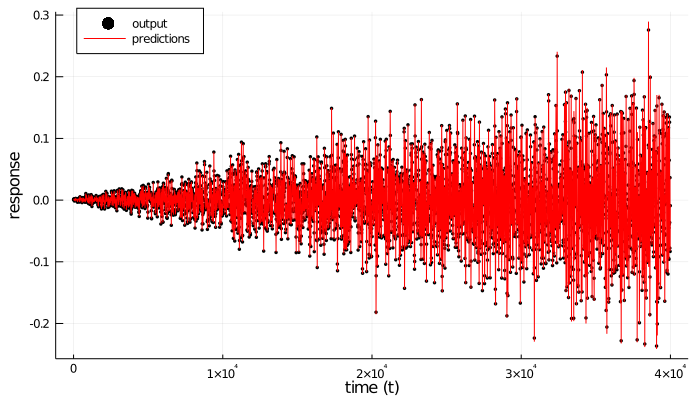

In [14]:
# Extract mean of state marginals
predictions = params_y[1][1,:]

# Plot every n-th time-point to avoid figure size exploding
n = 10

p3 = Plots.scatter(1:n:T_val, output_val[1:n:T_val], color="black", label="output", markersize=2, xlabel="time (t)", ylabel="response", legend=:topleft)
Plots.plot!(1:n:T_val, predictions[1:n:T_val], color="red", linewidth=1, label="predictions", size=(700,400))

In [15]:
Plots.savefig(p3, "viz/forecasts.png")

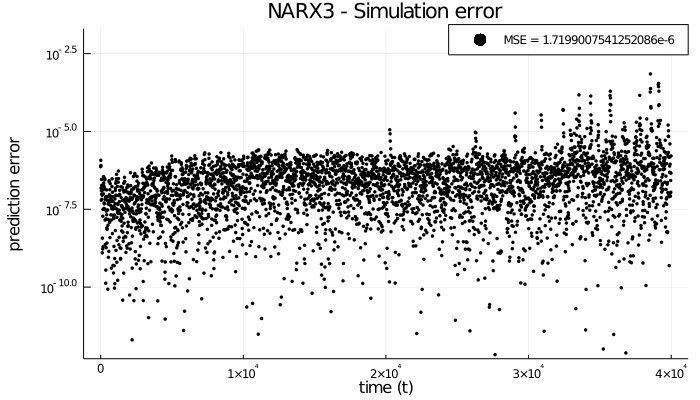

In [16]:
# Error plot
sim_error = (predictions .- output_val).^2
p3b = Plots.scatter(1:n:T_val, 
                   sim_error[1:n:end], 
                   color="black", 
                   label="", 
                   markersize=2, 
                   size=(700,400), 
                   xlabel="time (t)", 
                   ylabel="prediction error",
                   labels="MSE = "*string(mean(sim_error)),
                   yscale=:log10,
                   ylims=[1e-12, 1e-2],
                   title="NARX3 - Simulation error")

In [17]:
Plots.savefig(p3b, "viz/NARX3_sim-error.png")

In [18]:
println("MSE = "*string(mean(sim_error)))

MSE = 1.7199007541252086e-6


## 1-step ahead prediction error

In [19]:
# Fix estimates of coefficients and precision
mθ = params_θ[1][:,end]
mγ = params_γ[1][1,end]/params_γ[2][1,end]

# Initialize arrays of parameterizations
params_y = (zeros(1,T_val), zeros(1,T_val))

# Start progress bar
p = Progress(T_val, 1, "At time ")

# Perform inference at each time-step
for t = max(M,N)+1:T_val

    # Update progress bar
    update!(p, t)
    
    "Filtering"

    # Initialize marginals
    marginals[:y_t] = ProbabilityDistribution(Univariate, GaussianMeanPrecision, m=params_y[1][:,t-1], w=params_y[2][1,t-1])
    
    # Update input, output vectors
    x_t = output_val[t-1:-1:t-M]
    z_t = input_val[t-1:-1:t-N]
    
    # Set clamped variables
    data = Dict(:u_t => input_val[t],
                :x_t => x_t,
                :z_t => z_t,
                :θ => mθ,
                :γ => mγ)

    # Iterate variational parameter updates
    for i = 1:num_iterations
        
        # Update output prediction
        stepy!(data, marginals)
    end

    # Store current parameterizations of marginals
    params_y[1][1,t] = unsafeMean(marginals[:y_t])
    params_y[2][1,t] = marginals[:y_t].params[:w]

end

At time 100%|███████████████████████████████████████████| Time: 0:00:06


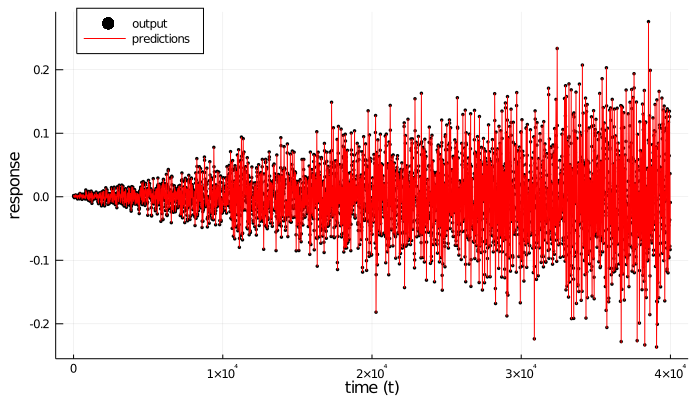

In [20]:
# Extract mean of state marginals
predictions = params_y[1][1,:]

# Plot every n-th time-point to avoid figure size exploding
n = 10

p3 = Plots.scatter(1:n:T_val, output_val[1:n:T_val], color="black", label="output", markersize=2, xlabel="time (t)", ylabel="response", legend=:topleft)
Plots.plot!(1:n:T_val, predictions[1:n:T_val], color="red", linewidth=1, label="predictions", size=(700,400))

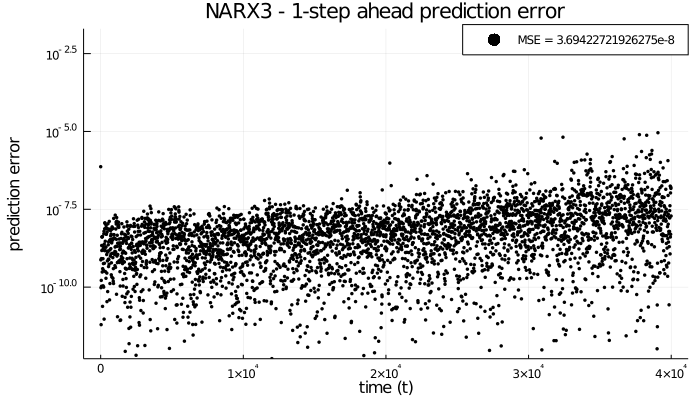

In [21]:
# Error plot
pred_error = (predictions .- output_val).^2
p4 = Plots.scatter(1:n:T_val, 
                   pred_error[1:n:end], 
                   color="black", 
                   label="", 
                   markersize=2, 
                   size=(700,400), 
                   xlabel="time (t)", 
                   ylabel="prediction error",
                   labels="MSE = "*string(mean(pred_error)),
                   yscale=:log10,
                   ylims=[1e-12, 1e-2],
                   title="NARX3 - 1-step ahead prediction error")

In [22]:
Plots.savefig(p4, "viz/NARX3_pred-error.png")

In [23]:
println("MSE = "*string(mean(pred_error)))

MSE = 3.69422721926275e-8


### Baseline: neural network

We have implemented a neural network in Matlab as a baseline method.

In [24]:
using MAT
results = matread("../sota-baselines/training_results.mat")

Dict{String,Any} with 10 entries:
  "options"    => Dict{String,Any}("viewnet"=>0.0,"nIter"=>1000.0,"feedthrough"…
  "details"    => Dict{String,Any}("trainingDetails"=>Dict{String,Any}("states"…
  "fs"         => 610.35
  "yVal"       => [0.0093978 0.012971 … -0.00605201 -0.00722471]
  "error"      => [0.00402748; 0.000125919; … ; 4.0117e-9; 3.17628e-8]
  "model"      => Dict{String,Any}("gradientFcn"=>"defaultderiv","derivFcn"=>"d…
  "yMod"       => [-0.0540646; 0.00174961; … ; -0.00611535; -0.00740293]
  ""           => UInt8[0x00 0x01 … 0x00 0x00]
  "timeTrain"  => [0.0 0.0016384 … 148.392 148.394]
  "modelParam" => Dict{String,Any}("nu"=>1.0,"nx"=>2.0,"transferFcn"=>"tansig",…

In [25]:
# Error plot
p5 = Plots.scatter(3:n:T_val, 
                   results["error"][3:n:end], 
                   color="black", 
                   label="", 
                   markersize=2, 
                   size=(700,400), 
                   yscale=:log10,
                   xlabel="time (t)", 
                   ylabel="prediction error",
                   labels="MSE = "*string(mean(results["error"])),
                   title="NN-4 - Prediction errors over time")

In [26]:
Plots.savefig(p5, "viz/NN4_pred-error.png")

In [27]:
println("MSE = "*string(mean(results["error"])))

MSE = 4.461002659364319e-7


## Visualize parameter estimates

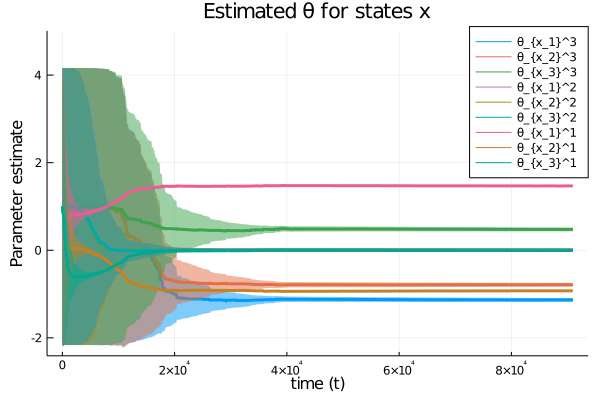

In [28]:
# Extract parameters of final coefficients for the history of observations
mθ_x = zeros(T_trn, 3*M)
sθ_x = zeros(T_trn, 3*M)
for k = 1:(3*M)
    mθ_x[:,k] = params_θ[1][k, 2:end]
    sθ_x[:,k] = sqrt.(inv.(params_θ[2][k,k, 2:end]))
end

# Labels
labels = ["θ_{x_1}^3" "θ_{x_2}^3" "θ_{x_3}^3" "θ_{x_1}^2" "θ_{x_2}^2" "θ_{x_3}^2" "θ_{x_1}^1" "θ_{x_2}^1" "θ_{x_3}^1"]

if viz
    # Plot every n-th time-point to avoid figure size exploding
    n = 50
    
    # Plot evolution of coefficients
    p5 = Plots.plot(1:n:T_trn, 
                    mθ_x[1:n:T_trn,:], 
                    ribbon=[sθ_x[1:n:T_trn,:], sθ_x[1:n:T_trn,:]], 
                    linewidth=3, 
                    labels=labels, 
                    xlabel="time (t)", 
                    ylabel="Parameter estimate", 
                    title="Estimated θ for states x",
                    legend=:topright, 
                    ylims=[-2.2, 4.8])
end

In [29]:
Plots.savefig(p5, "viz/coefficient_estimates_x.png")

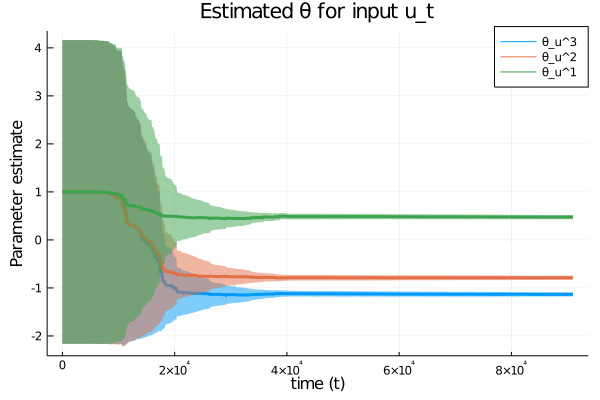

In [30]:
# Extract parameters of final coefficients for current input
mθ_u = zeros(T_trn, 3)
sθ_u = zeros(T_trn, 3)
for k = 1:3
    mθ_u[:,k] = params_θ[1][k, 2:end]
    sθ_u[:,k] = sqrt.(inv.(params_θ[2][k,k, 2:end]))
end

# Labels
labels = ["θ_u^3" "θ_u^2" "θ_u^1"]

if viz
    # Plot every n-th time-point to avoid figure size exploding
    n = 50
    
    # Plot evolution of coefficients
    p6 = Plots.plot(1:n:T_trn, 
                    mθ_u[1:n:T_trn,:], 
                    ribbon=[sθ_u[1:n:T_trn,:], sθ_u[1:n:T_trn,:]], 
                    linewidth=3, 
                    labels=labels, 
                    xlabel="time (t)", 
                    ylabel="Parameter estimate", 
                    title="Estimated θ for input u_t",
                    legend=:topright)
end

In [31]:
Plots.savefig(p6, "viz/coefficient_estimates_u.png")

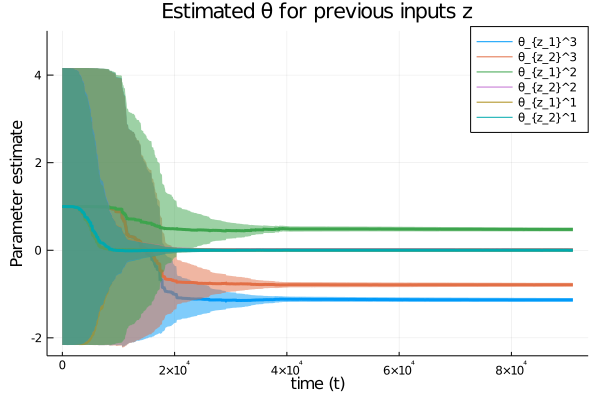

In [32]:
# Extract parameters of final coefficients for the history of observations
mθ_z = zeros(T_trn, 3*N)
sθ_z = zeros(T_trn, 3*N)
for k = 1:(3*N)
    mθ_z[:,k] = params_θ[1][k, 2:end]
    sθ_z[:,k] = sqrt.(inv.(params_θ[2][k,k, 2:end]))
end

# Labels
labels = ["θ_{z_1}^3" "θ_{z_2}^3" "θ_{z_1}^2" "θ_{z_2}^2" "θ_{z_1}^1" "θ_{z_2}^1"]

if viz
    # Plot every n-th time-point to avoid figure size exploding
    n = 50
    
    # Plot evolution of coefficients
    p7 = Plots.plot(1:n:T_trn, 
                    mθ_z[1:n:T_trn,:], 
                    ribbon=[sθ_z[1:n:T_trn,:], sθ_z[1:n:T_trn,:]], 
                    linewidth=3, 
                    labels=labels, 
                    xlabel="time (t)", 
                    ylabel="Parameter estimate", 
                    title="Estimated θ for previous inputs z",
                    legend=:topright, 
                    ylims=[-2.2, 4.8])
end

In [33]:
Plots.savefig(p7, "viz/coefficient_estimates_z.png")

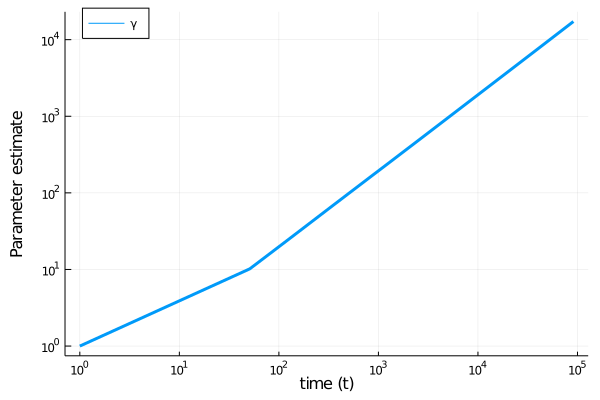

In [34]:
# Extract parameters of final precision posteriors
mγ = params_γ[1][1,2:end] ./ params_γ[2][1,2:end]
sγ = sqrt.(params_γ[1][1,2:end] ./ params_γ[2][1,2:end].^2)

if viz
    # Plot evolution of precision parameter
#     p8 = Plots.plot(1:n:T_trn, mγ[1:n:T_trn], ribbon=[sγ[1:n:T_trn], sγ[1:n:T_trn]], label="γ", xlabel="time (t)", linewidth=3, size=(600,400), xscale=:log10, legend=:topleft)
    p8 = Plots.plot(1:n:T_trn, 
                    mγ[1:n:T_trn], 
                    label="γ", 
                    xlabel="time (t)", 
                    ylabel="Parameter estimate", 
                    linewidth=3, 
                    size=(600,400), 
                    xscale=:log10, 
                    yscale=:log10, 
                    legend=:topleft)
end

In [35]:
Plots.savefig(p8, "viz/precision_estimates.png")